In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
img_list = ['./1080.png','./1025.png','./1047.png','1072.png']

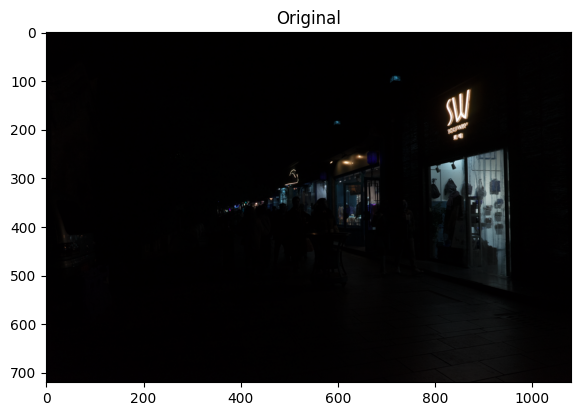

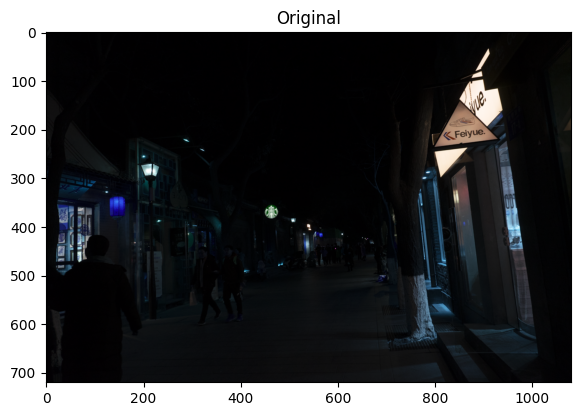

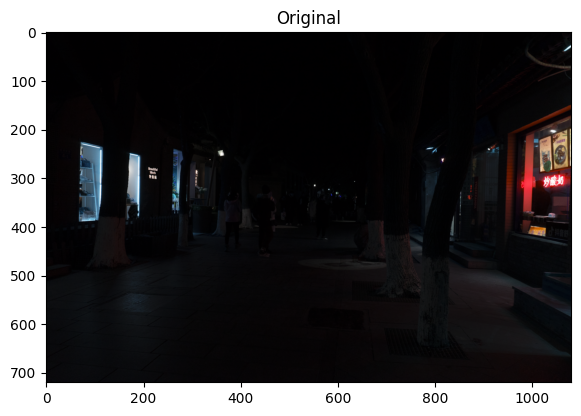

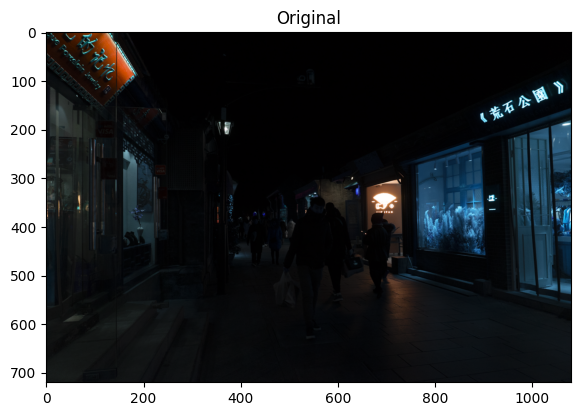

In [3]:

for img in img_list:

    img_one= cv2.imread(img)
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 1, 1)
    plt.title('Original')
    plt.imshow(img_one)



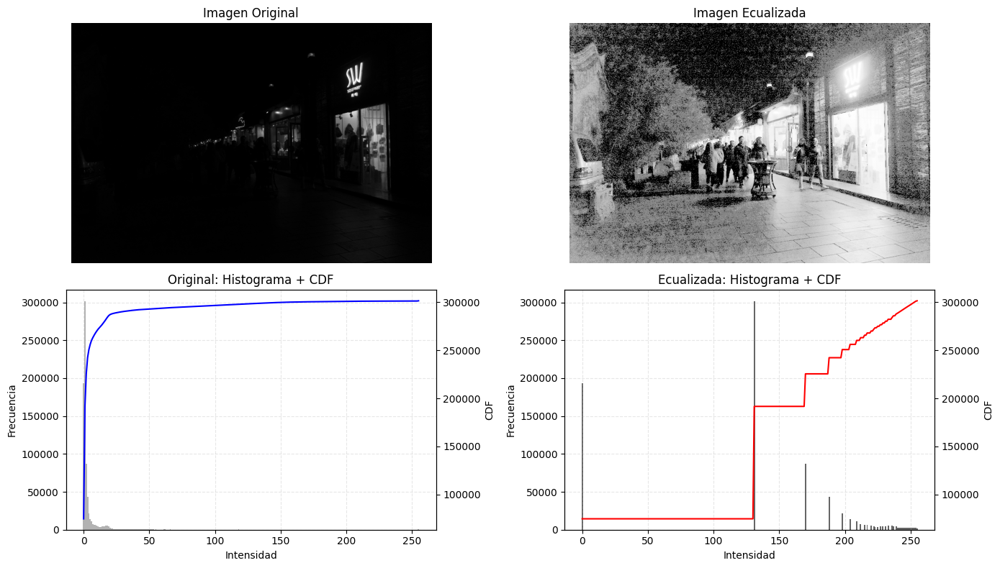

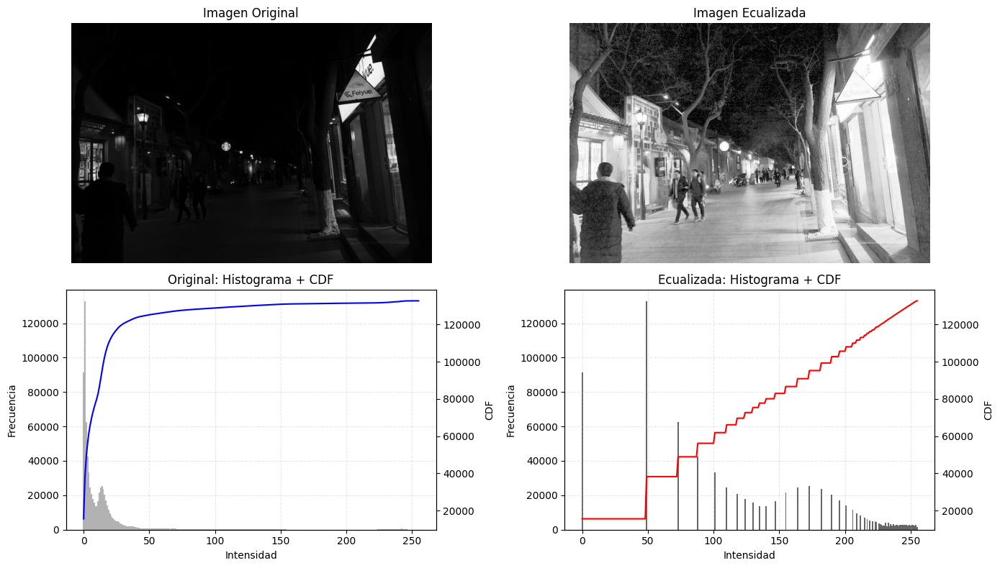

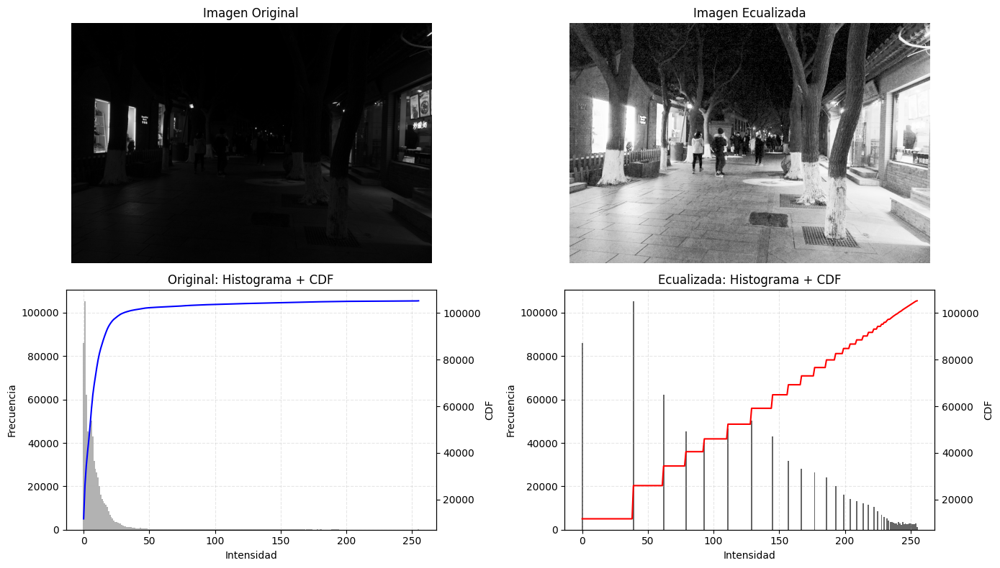

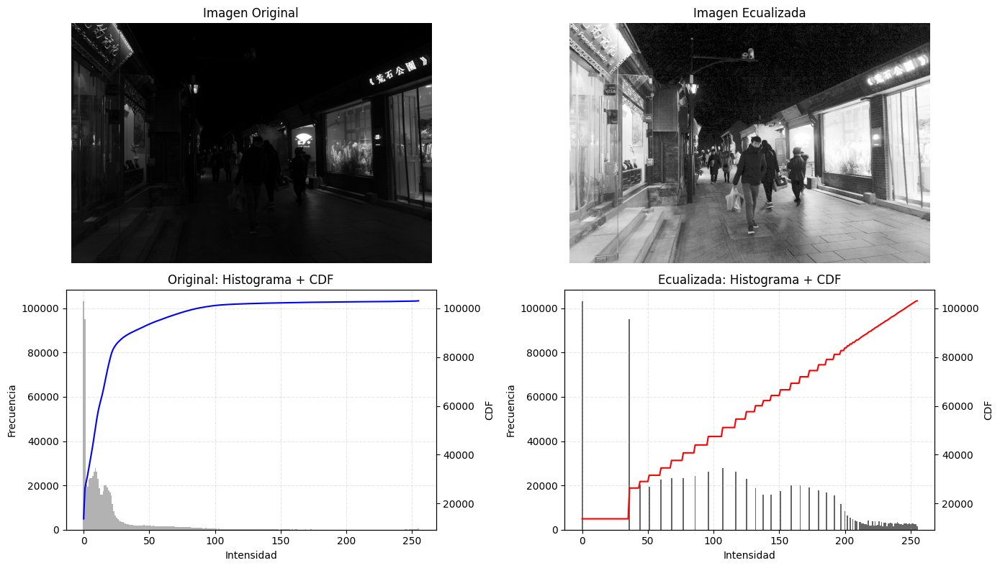

In [11]:

def histogram_equalization(img_path):
    img_one = cv2.imread(img_path)
    gray = cv2.cvtColor(img_one, cv2.COLOR_BGR2GRAY)

    # Ecualizar histograma
    equalized = cv2.equalizeHist(gray)

    # Calcular histogramas
    hist_original = cv2.calcHist([gray], [0], None, [256], [0, 256]).flatten()
    hist_equalized = cv2.calcHist([equalized], [0], None, [256], [0, 256]).flatten()

    # Calcular CDF
    cdf_original = hist_original.cumsum()
    cdf_equalized = hist_equalized.cumsum()

    # Normalizar CDF
    cdf_original_normalized = cdf_original * hist_original.max() / cdf_original.max()
    cdf_equalized_normalized = cdf_equalized * hist_equalized.max() / cdf_equalized.max()

    # Mostrar todo en una misma figura
    fig, axs = plt.subplots(2, 2, figsize=(14, 8))

    # Imagen original
    axs[0, 0].imshow(gray, cmap='gray')
    axs[0, 0].set_title("Imagen Original")
    axs[0, 0].axis('off')

    # Imagen ecualizada
    axs[0, 1].imshow(equalized, cmap='gray')
    axs[0, 1].set_title("Imagen Ecualizada")
    axs[0, 1].axis('off')

    # Histograma + CDF original
    axs[1, 0].bar(np.arange(256), hist_original, width=1.0, color='gray', alpha=0.6, label='Histograma')
    axs[1, 0].set_title("Original: Histograma + CDF")
    axs[1, 0].set_xlabel("Intensidad")
    axs[1, 0].set_ylabel("Frecuencia")
    axs[1, 0].grid(True, linestyle='--', alpha=0.3)
    ax2 = axs[1, 0].twinx()
    ax2.plot(cdf_original_normalized, color='blue', label='CDF')
    ax2.set_ylabel("CDF")

    # Histograma + CDF ecualizada
    axs[1, 1].bar(np.arange(256), hist_equalized, width=1.0, color='black', alpha=0.6, label='Histograma')
    axs[1, 1].set_title("Ecualizada: Histograma + CDF")
    axs[1, 1].set_xlabel("Intensidad")
    axs[1, 1].set_ylabel("Frecuencia")
    axs[1, 1].grid(True, linestyle='--', alpha=0.3)
    ax4 = axs[1, 1].twinx()
    ax4.plot(cdf_equalized_normalized, color='red', label='CDF')
    ax4.set_ylabel("CDF")

    plt.tight_layout()
    plt.show()


for img_path in img_list:
    histogram_equalization(img_path)


In [5]:



def  op_math(img):
    img_double_one = cv2.imread(img)
    img_double_one=img_double_one.astype(np.float64) # Convertir a float64 para evitar desbordamiento
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 1, 1)
    plt.title('Original')   
    plt.imshow(img_double_one)




    suma = img_double_one + img_double_one
    resta= img_double_one - img_double_one
    multiplicacion= img_double_one * img_double_one
    division= img_double_one / img_double_one


    plt.figure(figsize=(20, 10))

    plt.subplot(2, 2, 1)
    plt.title('Suma')
    plt.imshow(suma)
    plt.subplot(2, 2, 2)
    plt.title('Resta')
    plt.imshow(resta)
    plt.subplot(2, 2, 3)
    plt.title('Multiplicacion')                 
    plt.imshow(multiplicacion)
    plt.subplot(2, 2, 4)
    plt.title('Division')
    plt.imshow(division)


    plt.show()


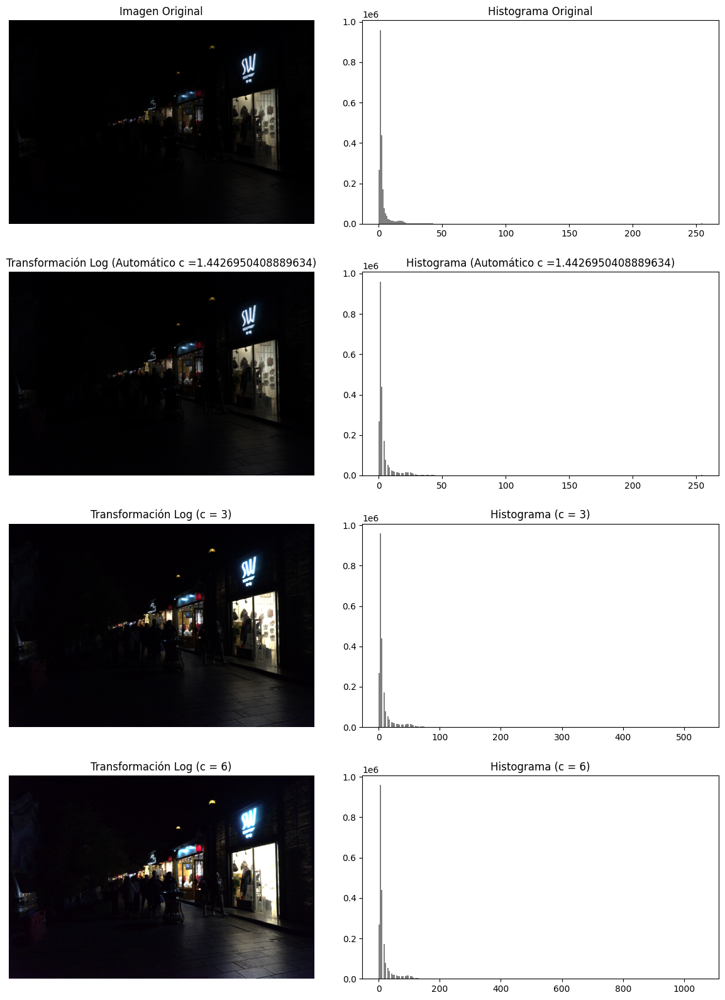

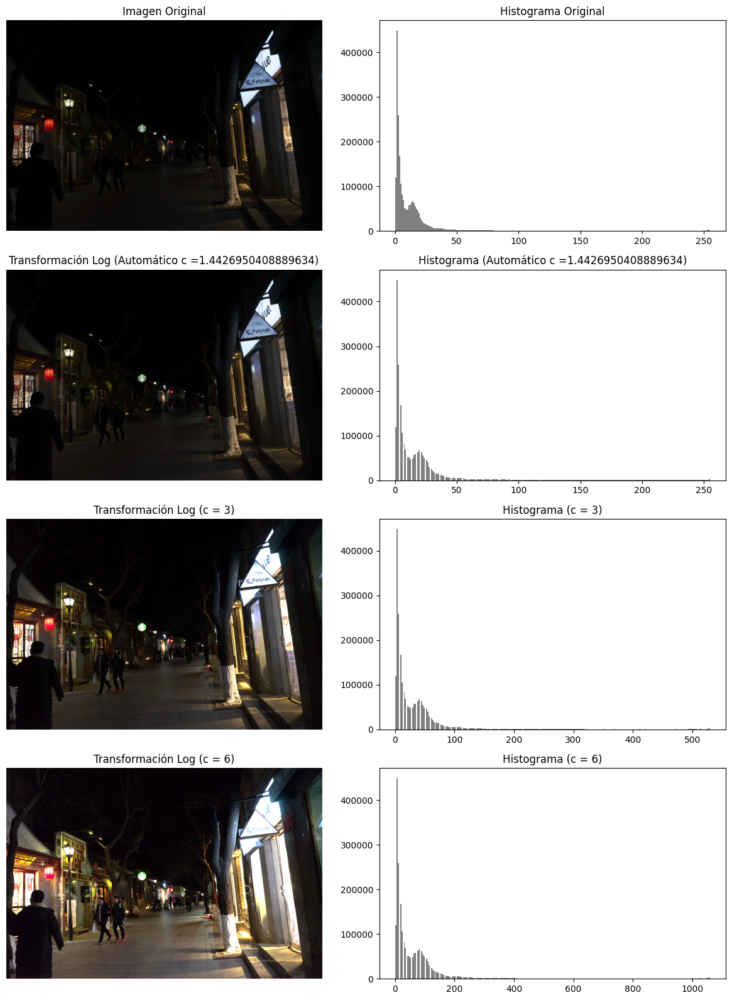

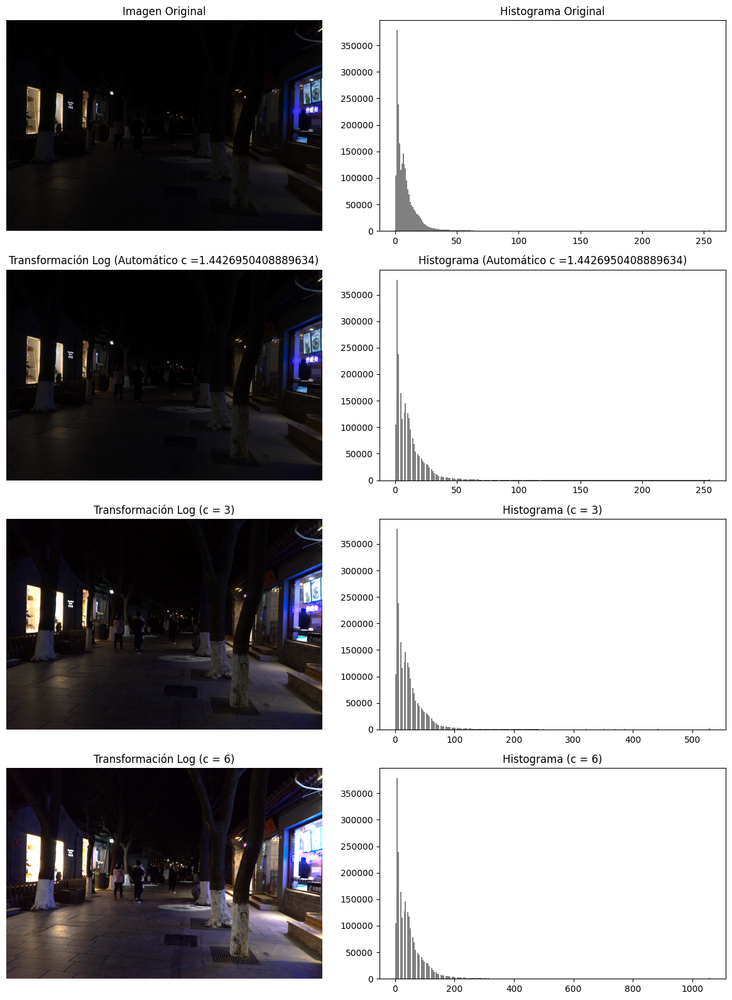

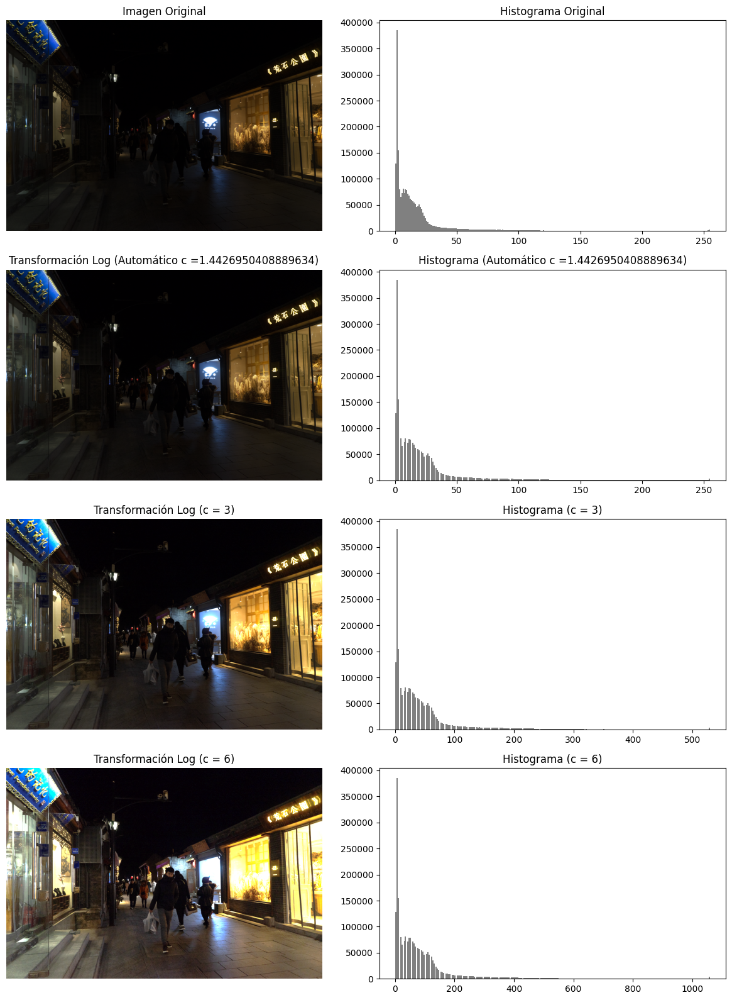

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def adjust_intensity_log(img_path):
    # Leer imagen
    img = cv2.imread(img_path)

    # Convertir a RGB y normalizar
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_norm = img_rgb.astype(np.float64) / 255.0

    # Definir valores de c
    c_auto = 1 / np.log(1 + np.max(img_norm))
    c_values = [(f"Automático c ={c_auto}", c_auto), ("c = 3",3), ("c = 6", 6.0), ]

    total = len(c_values)
    plt.figure(figsize=(12, 4 * (total + 1)))

    # Imagen original
    plt.subplot(total + 1, 2, 1)
    plt.imshow(img_norm)
    plt.title("Imagen Original")
    plt.axis('off')

    # Histograma original
    plt.subplot(total + 1, 2, 2)
    plt.hist((img_norm * 255).ravel(), bins=256, color='gray')
    plt.title("Histograma Original")

    # Aplicar transformaciones
    for idx, (label, c) in enumerate(c_values):
        log_img = c * np.log(1 + img_norm)
        log_img_clipped = np.clip(log_img, 0, 1)  # evitar valores extremos (opcional para visualización)

        # Imagen transformada
        plt.subplot(total + 1, 2, 2 * (idx + 1) + 1)
        plt.imshow(log_img_clipped)
        plt.title(f'Transformación Log ({label})')
        plt.axis('off')

        # Histograma sin renormalizar
        plt.subplot(total + 1, 2, 2 * (idx + 1) + 2)
        plt.hist((log_img * 255).ravel(), bins=256, color='gray')
        plt.title(f'Histograma ({label})')

    plt.tight_layout()
    plt.show()

# Ejecutar para cada imagen
for img_path in img_list:
    adjust_intensity_log(img_path)


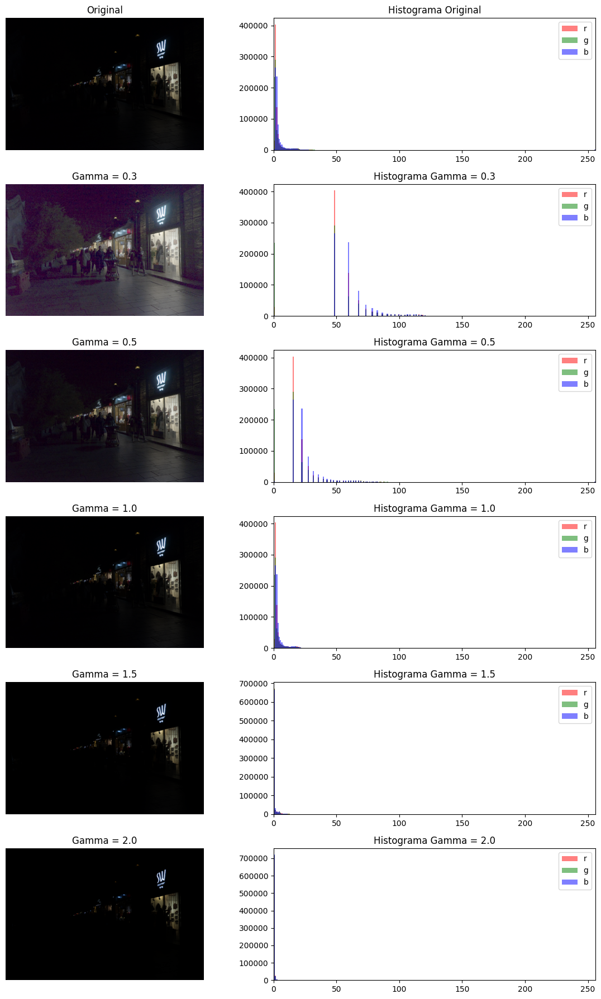

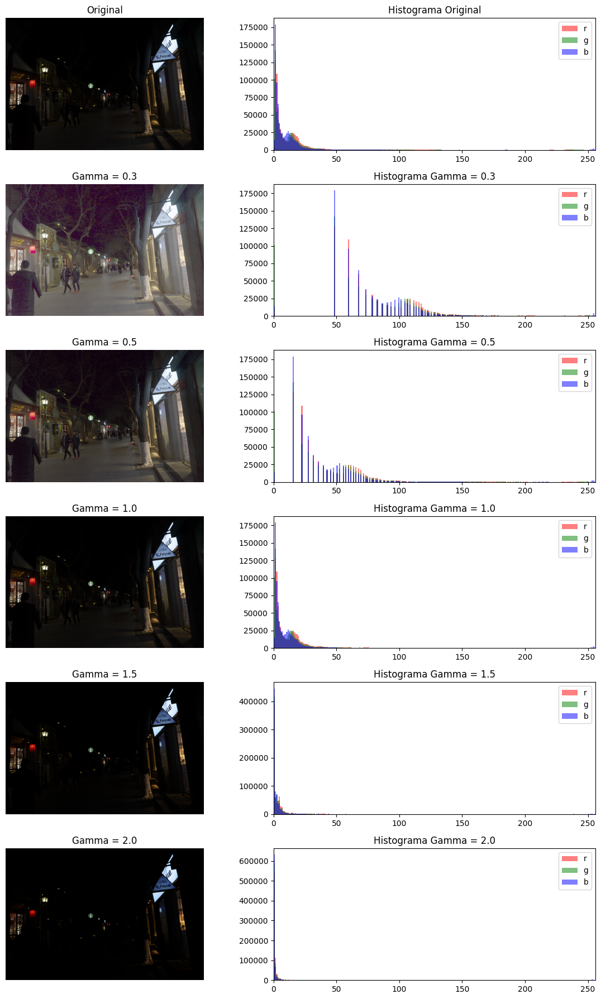

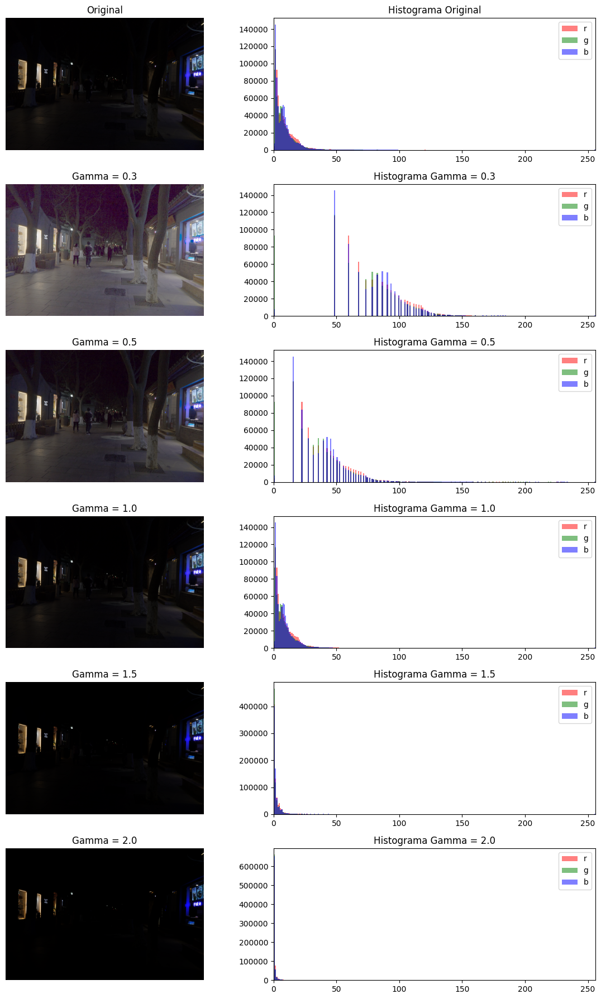

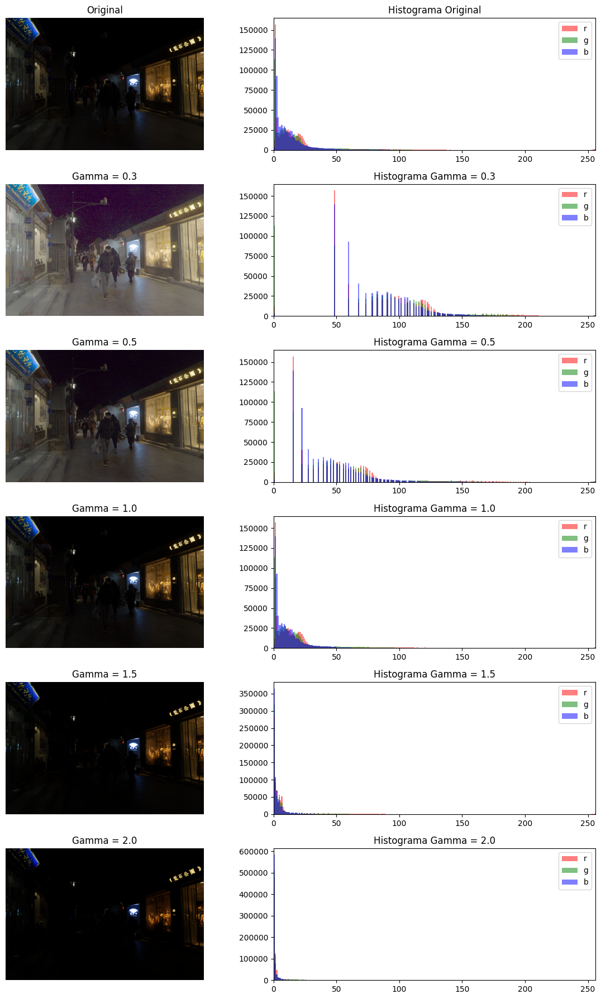

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def adjust_intensity_gamma(img_path):
    # Leer imagen y convertir a RGB
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_norm = img_rgb.astype(np.float64) / 255.0

    # Lista de gammas a aplicar (máximo 5, porque 1 es la original)
    gammas = [0.3, 0.5, 1.0, 1.5, 2.0]  # Puedes cambiar los valores si lo deseas
    gamma_imgs = [(img_norm, 'Original')]

    for g in gammas:
        gamma_img = np.power(img_norm, g)
        gamma_imgs.append((gamma_img, f'Gamma = {g}'))

    # Mostrar imagen + histograma (6 filas, 2 columnas)
    plt.figure(figsize=(12, 18))  # 6 filas * 2 columnas

    for i, (img_corr, title) in enumerate(gamma_imgs[:6]):  # Limitar a 6 imágenes
        # Imagen
        plt.subplot(6, 2, 2*i + 1)
        plt.imshow(img_corr)
        plt.title(title)
        plt.axis('off')

        # Histograma RGB
        plt.subplot(6, 2, 2*i + 2)
        for channel, color in enumerate(['r', 'g', 'b']):
            plt.hist((img_corr[:, :, channel] * 255).astype(np.uint8).ravel(),
                     bins=256, range=(0, 256), color=color, alpha=0.5, label=color)
        plt.title(f'Histograma {title}')
        plt.xlim([0, 256])
        plt.legend()

    plt.tight_layout()
    plt.show()

# Ejecutar la función para cada imagen
for img in img_list:
    adjust_intensity_gamma(img)


Min: 0.00, Max: 1.00


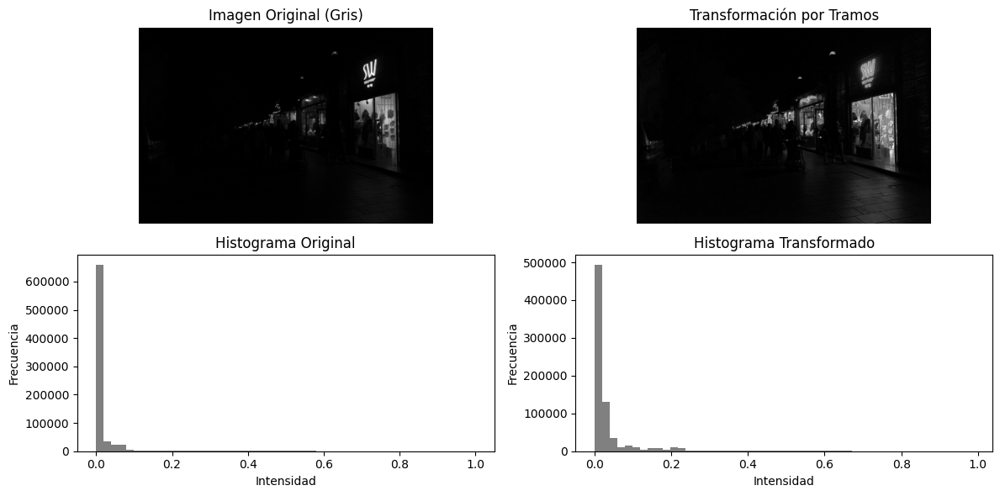

Min: 0.00, Max: 1.00


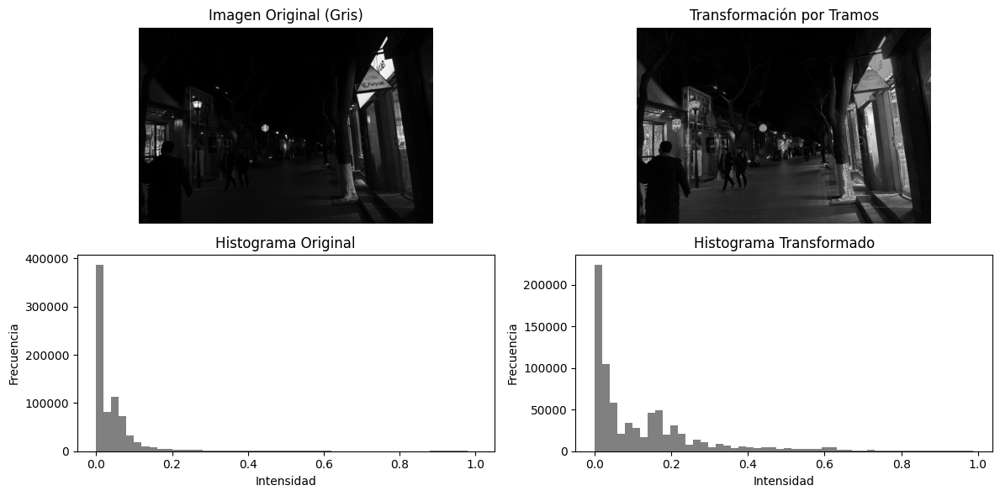

Min: 0.00, Max: 1.00


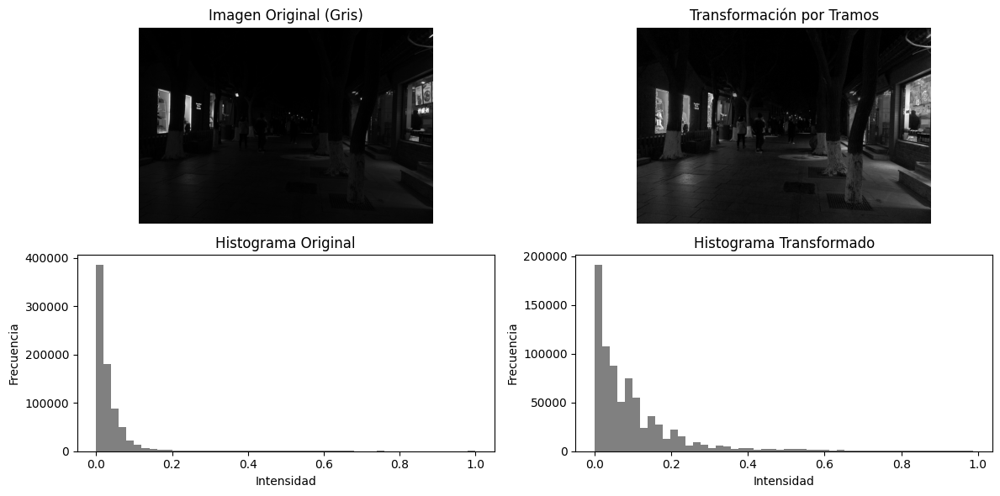

Min: 0.00, Max: 1.00


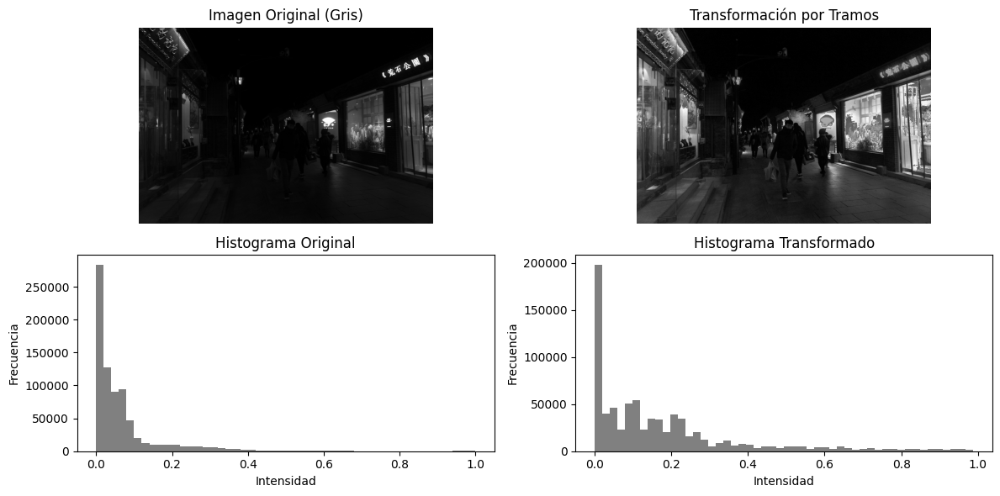

In [30]:


def piecewise_linear_transform_grayscale(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Normalizar a [0,1]
    img_norm = gray.astype(np.float64) / 255.0
    print(f"Min: {np.min(img_norm):.2f}, Max: {np.max(img_norm):.2f}")

    # Inicializar imagen transformada
    img_transformed = np.zeros_like(img_norm)

    # Transformación por tramos
    mask_1 = img_norm <= 0.33
    mask_2 = (img_norm > 0.33) & (img_norm <= 0.66)
    mask_3 = img_norm > 0.66

    img_transformed[mask_1] = 3 * img_norm[mask_1]
    img_transformed[mask_2] =  img_norm[mask_2]
    img_transformed[mask_3] = 0.5 * img_norm[mask_3] + 0.15

    # Asegurar valores en [0,1]
    img_transformed = np.clip(img_transformed, 0, 1)

    # Mostrar imagen original y transformada con sus histogramas
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))

    axes[0, 0].imshow(img_norm, cmap='gray')
    axes[0, 0].set_title("Imagen Original (Gris)")
    axes[0, 0].axis('off')

    axes[1, 0].hist(img_norm.ravel(), bins=50, color='gray')
    axes[1, 0].set_title("Histograma Original")
    axes[1, 0].set_xlabel("Intensidad")
    axes[1, 0].set_ylabel("Frecuencia")

    axes[0, 1].imshow(img_transformed, cmap='gray')
    axes[0, 1].set_title("Transformación por Tramos")
    axes[0, 1].axis('off')

    axes[1, 1].hist(img_transformed.ravel(), bins=50, color='gray')
    axes[1, 1].set_title("Histograma Transformado")
    axes[1, 1].set_xlabel("Intensidad")
    axes[1, 1].set_ylabel("Frecuencia")

    plt.tight_layout()
    plt.show()

# Ejemplo para múltiples imágenes
for img in img_list:
    piecewise_linear_transform_grayscale(img)


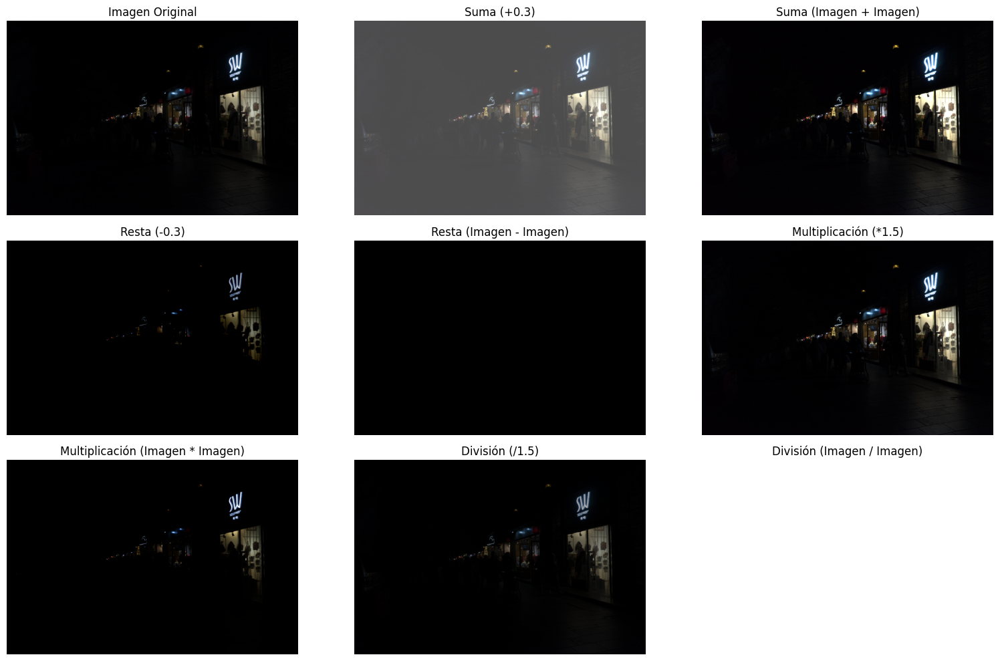

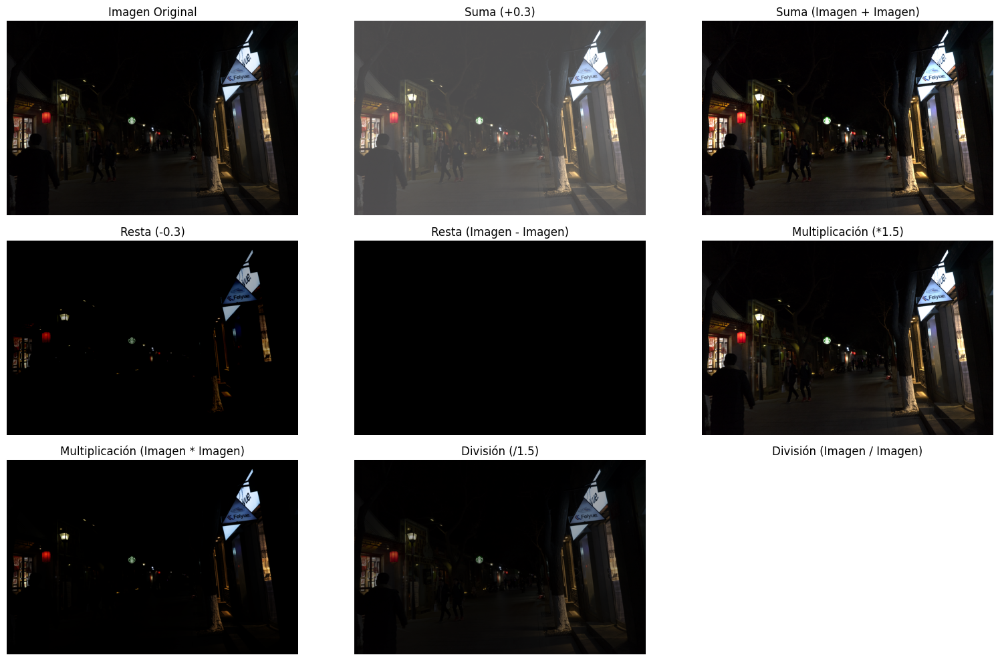

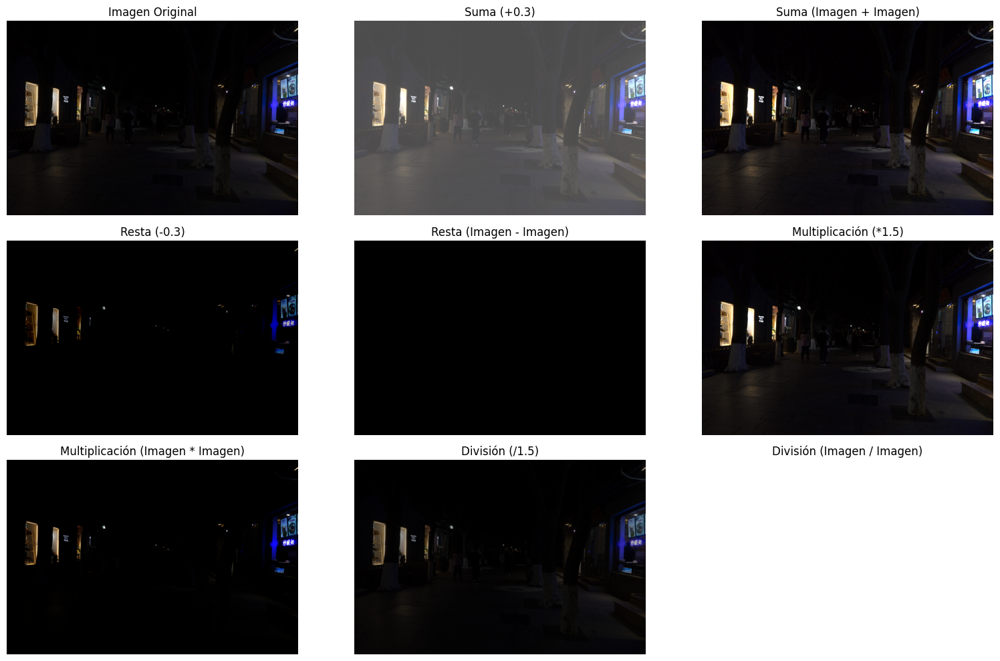

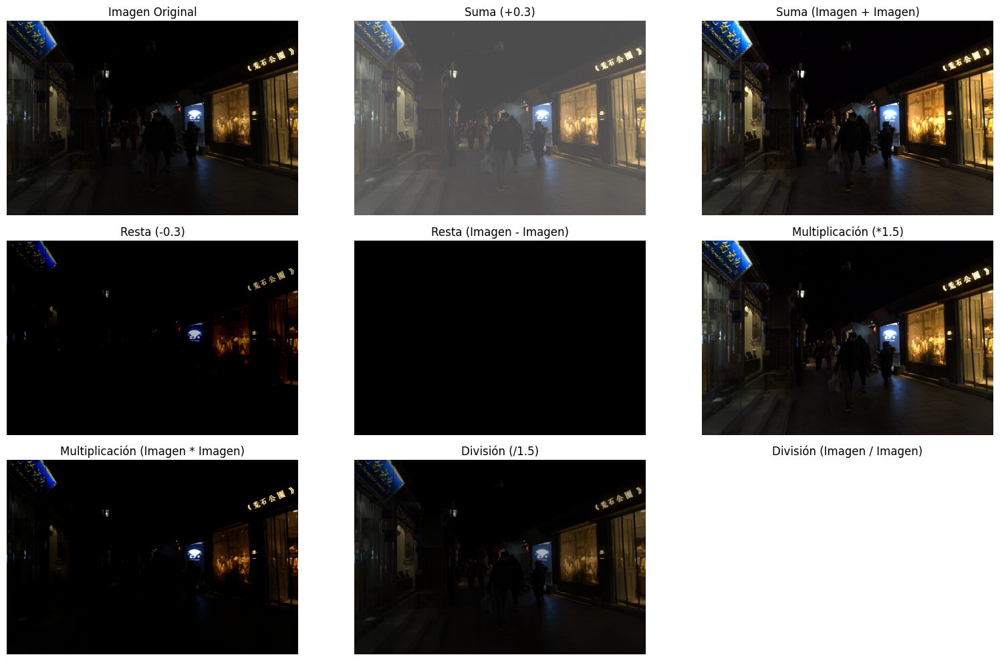

In [26]:

def op_math(img_path):
    # Leer y normalizar imagen
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_double = img_rgb.astype(np.float64) / 255.0

    # Escalares
    beta = 0.3
    alpha = 1.5

    # Operaciones imagen con escalar
    suma_esc = img_double + beta
    resta_esc = img_double - beta
    mult_esc = img_double * alpha
    div_esc = img_double / alpha

    # Operaciones imagen con imagen
    suma_img = img_double + img_double
    resta_img = img_double - img_double
    mult_img = img_double * img_double
    div_img = np.divide(img_double, img_double, out=np.ones_like(img_double), where=img_double!=0)

    # Clipping
    suma_esc = np.clip(suma_esc, 0, 1)
    resta_esc = np.clip(resta_esc, 0, 1)
    mult_esc = np.clip(mult_esc, 0, 1)
    div_esc = np.clip(div_esc, 0, 1)

    suma_img = np.clip(suma_img, 0, 1)
    resta_img = np.clip(resta_img, 0, 1)
    mult_img = np.clip(mult_img, 0, 1)
    div_img = np.clip(div_img, 0, 1)

    # Mostrar resultados
    plt.figure(figsize=(16, 10))

    plt.subplot(3, 3, 1)
    plt.title('Imagen Original')
    plt.imshow(img_double)
    plt.axis('off')

    plt.subplot(3, 3, 2)
    plt.title(f'Suma (+{beta})')
    plt.imshow(suma_esc)
    plt.axis('off')

    plt.subplot(3, 3, 3)
    plt.title('Suma (Imagen + Imagen)')
    plt.imshow(suma_img)
    plt.axis('off')

    plt.subplot(3, 3, 4)
    plt.title(f'Resta (-{beta})')
    plt.imshow(resta_esc)
    plt.axis('off')

    plt.subplot(3, 3, 5)
    plt.title('Resta (Imagen - Imagen)')
    plt.imshow(resta_img)
    plt.axis('off')

    plt.subplot(3, 3, 6)
    plt.title(f'Multiplicación (*{alpha})')
    plt.imshow(mult_esc)
    plt.axis('off')

    plt.subplot(3, 3, 7)
    plt.title('Multiplicación (Imagen * Imagen)')
    plt.imshow(mult_img)
    plt.axis('off')

    plt.subplot(3, 3, 8)
    plt.title(f'División (/{alpha})')
    plt.imshow(div_esc)
    plt.axis('off')

    plt.subplot(3, 3, 9)
    plt.title('División (Imagen / Imagen)')
    plt.imshow(div_img)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


for img in img_list:
    op_math(img)
